# 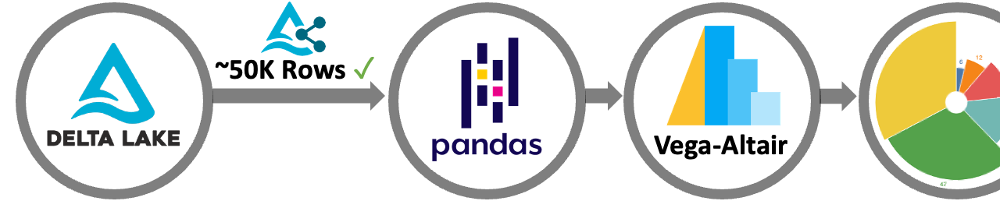

# Vega-Altair

## Environment Setup

### Import Libraries

In [1]:
# Standard Libraries
import pathlib

# External Libraries
import altair as alt
import delta_sharing
import requests

In [2]:
# URL of profile for example Delta Sharing Server
url = 'https://databricks-datasets-oregon.s3-us-west-2.amazonaws.com/delta-sharing/share/open-datasets.share'

# Path of profile for example Delta Sharing Server
path = pathlib.Path('./profile.share').resolve().as_posix()

### Read Delta Table

In [3]:
profile = requests.get(url).text
print(profile)

{
  "shareCredentialsVersion": 1,
  "endpoint": "https://sharing.delta.io/delta-sharing/",
  "bearerToken": "faaie590d541265bcab1f2de9813274bf233"
}


In [4]:
with open(path, 'w') as file:
  file.write(profile)

In [5]:
client = delta_sharing.SharingClient(path)
tables = client.list_all_tables()
tables

[Table(name='COVID_19_NYT', share='delta_sharing', schema='default'),
 Table(name='boston-housing', share='delta_sharing', schema='default'),
 Table(name='flight-asa_2008', share='delta_sharing', schema='default'),
 Table(name='lending_club', share='delta_sharing', schema='default'),
 Table(name='nyctaxi_2019', share='delta_sharing', schema='default'),
 Table(name='nyctaxi_2019_part', share='delta_sharing', schema='default'),
 Table(name='owid-covid-data', share='delta_sharing', schema='default')]

In [30]:
table = tables[4]  # NYC Taxi Dataset
pdf = delta_sharing.load_as_pandas(
  url=f'{path}#{table.share}.{table.schema}.{table.name}',
  limit=1000000,
)

pdf

,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,rate_code_id,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,total_amount
0,1,2019-05-27 10:13:54,2018-09-13 10:38:20,2.0,10.40,1.0,NaN,138,163,1.0,31.50,2.5,0.5,0.00,6.12,0.3,40.92,2.5
1,None,2019-09-01 07:51:00,2019-09-01 08:12:00,NaN,4.70,NaN,NaN,133,61,NaN,24.13,2.75,0.5,0.00,0.00,0.3,27.68,0.0
2,None,2019-09-01 07:06:00,2019-09-01 07:23:00,NaN,3.97,NaN,NaN,3,169,NaN,22.93,2.75,0.5,0.00,0.00,0.3,26.48,0.0
3,None,2019-09-01 07:07:00,2019-09-01 07:31:00,NaN,14.48,NaN,NaN,241,79,NaN,45.50,2.75,0.5,0.00,0.00,0.3,49.05,0.0
4,None,2019-09-01 07:26:00,2019-09-01 07:49:00,NaN,10.07,NaN,NaN,257,48,NaN,33.61,2.75,0.5,0.00,6.12,0.3,43.28,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999995,2,2019-12-19 15:49:47,2019-12-19 16:05:41,1.0,1.67,1.0,NaN,113,230,2.0,11.00,0,0.5,0.00,0.00,0.3,14.30,2.5
999996,1,2019-12-19 15:46:22,2019-12-19 16:35:59,1.0,0.00,1.0,NaN,14,217,1.0,28.20,0,0.5,0.00,0.00,0.3,29.00,0.0
999997,2,2019-12-19 15:35:12,2019-12-19 15:49:40,1.0,1.31,1.0,NaN,236,238,1.0,10.00,0,0.5,2.00,0.00,0.3,15.30,2.5
999998,2,2019-12-19 15:26:25,2019-12-19 15:38:42,6.0,1.78,1.0,NaN,114,90,1.0,9.50,0,0.5,2.56,0.00,0.3,15.36,2.5


In [31]:
# randomly sample 50K points
df = pdf[pdf['total_amount'] > 0].sample(50000)

## Plot Data

By default Vega-Altair restricts the number of rows to 5K. It's able to handle larger datasets like our 50K rows no problem. The creators wanted users to think about how the data could be downsampled or aggregated for plotting and this is a built-in speed bump. We can turn this limit off with `alt.data_transformers.disable_max_rows()`.

In [33]:
# Turn off 5K rows limit
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [56]:
columns = ['passenger_count', 'trip_distance', 'tolls_amount']
chart_v1 = alt.Chart(df[columns]).mark_circle().encode(
  x='passenger_count:Q',
  y='trip_distance:Q',
)

chart_v1

alt.Chart(...)

In [57]:
columns = ['passenger_count', 'trip_distance', 'tolls_amount']

# By changing `mark_circle` to `mark_bar`, we've updated how
# we're visually encoding our data!
chart_v2 = alt.Chart(df[columns]).mark_bar().encode(
  x='passenger_count:N',
  y='trip_distance:Q',
)

chart_v2

alt.Chart(...)

In [58]:
# We can show our charts side-by-side
chart_v1 | chart_v2

alt.HConcatChart(...)

More complicated transformations and chart types are also possible with Vega-Altair. In my next post I'll cover how we can improve the performance to handle up to 1 million points smoothly and show how to customize your charts!

In [60]:
# Compound 
columns = ['trip_distance', 'fare_amount', 'tip_amount', 'tolls_amount', 'total_amount', ]
chart = alt.Chart(df[columns]).transform_fold(
  columns,
  as_ = ['Measurement_type', 'value', ]
).transform_density(
  density='value',
  bandwidth=0.3,
  groupby=['Measurement_type'],
  extent=[0, 8],
).mark_area().encode(
  alt.X('value:Q'),
  alt.Y('density:Q'),
  alt.Row('Measurement_type:N')
).properties(width=300, height=50)

chart

alt.Chart(...)